In [1]:
from app.simulator import Simulator
import numpy as np

# Basiswerte
K = 3
J = 4
t = np.linspace(0, 365, 365)

# Parameter - t[-1] statt len(t), da der Endwert wichtig ist und nicht die Größe von t
beta_asym   = np.ones((int(t[-1]), J, K, K)) * 0.7
beta_sym    = np.ones((int(t[-1]), J, K, K)) * 0.3
beta_sev    = np.ones((int(t[-1]), J, K, K)) * 0.05
gamma_asym  = np.ones((int(t[-1]), J, K)) * 0.1
gamma_sym   = np.ones((int(t[-1]), J, K)) * 1 / 12.5
gamma_sev   = np.ones((int(t[-1]), J, K)) * 0.05
gamma_sev_r = np.ones((int(t[-1]), J, K)) * 0.075
gamma_sev_d = np.ones((int(t[-1]), J, K)) * 0.1
epsilon     = np.ones((int(t[-1]), J, K)) * 0.125
psi         = np.ones((int(t[-1]), J, K)) * np.array([0.5, 0.3, 0.25])
psi[0:180, :, :] = 0
sigma       = np.ones((int(t[-1]), J, K)) * np.array([0.002, 0.025, 0.10])
my_sym      = np.ones((int(t[-1]), J, K)) * 0.4
my_sev      = np.ones((int(t[-1]), J, K)) * 0.01
tau_asym    = np.ones((int(t[-1]), J, K)) * 0.001
tau_sev     = np.ones((int(t[-1]), J, K)) * 0.25
tau_sym     = np.ones((int(t[-1]), J, K)) * 0.01
rho_mat     = np.ones((int(t[-1]), J, K)) * np.array([1 / 180, 0, 0])
rho_vac     = np.ones((int(t[-1]), J, K)) * 1 / 270
rho_rec     = np.ones((int(t[-1]), J, K)) * 1 / 90
nu          = np.ones((int(t[-1]), J, K))
nu[0:125, :, :]     = nu[0:125, :, :] * 100000 / 83000000
nu[126:250, :, :]   = nu[126:250, :, :] * 300000 / 83000000
nu[251:365, :, :]   = nu[251:365, :, :] * 200000 / 83000000

# Stammdaten - werden aus .csv-Dateien eingelesen / json-Dateien eingelesen
N           = np.array([[50000, 150000, 100000], [10000, 22000, 10000], [15000, 17000, 20000], [150000, 300000, 100000]])
B           = np.sum(N, axis=1) * 0.025

# Basiswerte - müssen zur Simulation gesetzt werden
Etr         = np.zeros((J, K))
Ent         = np.zeros((J, K))
Iasym       = np.array([[50, 500, 450], [25, 175, 100], [25, 100, 175], [500, 1500, 1000]])
Isym        = Iasym * 0.5
Isev        = Iasym * 0.05
Qasym       = np.zeros((J, K))
Qsym        = np.zeros((J, K))
Qsev        = np.zeros((J, K))
R0          = np.ones((J,K)) * 1.2 # 1.2 = Basisreproduktionszahl aus Daten des RKI / Statista
D0          = np.zeros((J,K))
V0          = np.zeros((J,K))
M0          = np.zeros((J,K))
S0          = N - Etr - Ent - Iasym - Isym - Isev - Qasym - Qsym - Qsev - D0 - V0 - R0

params = {
    "J": J,
    "K": K,
    "N": N,
    "t": t,
    "N_total": np.sum(N, axis=1),
    "B": B,
    "M": M0,
    "S": S0,
    "V": V0,
    "E_tr": Etr,
    "E_nt": Ent,
    "I_asym": Iasym,
    "I_sym": Isym,
    "I_sev": Isev,
    "Q_asym": Qasym,
    "Q_sym": Qsym,
    "Q_sev": Qsev,
    "R": R0,
    "D": D0,
    "sigma": sigma,
    "rho_mat": rho_mat,
    "rho_vac": rho_vac,
    "rho_rec": rho_rec,
    "nu": nu,
    "beta_asym": beta_asym,
    "beta_sym": beta_sym,
    "beta_sev": beta_sev,
    "psi": psi,
    "epsilon": epsilon,
    "gamma_asym": gamma_asym,
    "gamma_sym": gamma_sym,
    "gamma_sev": gamma_sev,
    "gamma_sev_r": gamma_sev_r,
    "gamma_sev_d": gamma_sev_d,
    "my_sym": my_sym,
    "my_sev": my_sev,
    "tau_asym": tau_asym,
    "tau_sym": tau_sym,
    "tau_sev": tau_sev,
}

sim = Simulator()

#M, V, S, E_tr, E_nt, I_asym, I_sym, I_sev, Q_asym, Q_sym, Q_sev, R, D = sim.run(params, "M V S E2 I3 Q3 R D")
M, V, S, E_tr, E_nt, I_asym, I_sym, I_sev, Q_asym, Q_sym, Q_sev, R, D,  = sim.run(params, "full")

In [2]:
# Füge alle Values in ein Dictionary
parameters = {
    "M": M,
    "V": V,
    "S": S,
    "E_tr": E_tr,
    "E_nt": E_nt,
    "I_asym": I_asym,
    "I_sym": I_sym,
    "I_sev": I_sev,
    "Q_asym": Q_asym,
    "Q_sym": Q_sym,
    "Q_sev": Q_sev,
    "R": R,
    "D": D,
}

In [3]:
from app.view import View
test = View()

/home/yoflem/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




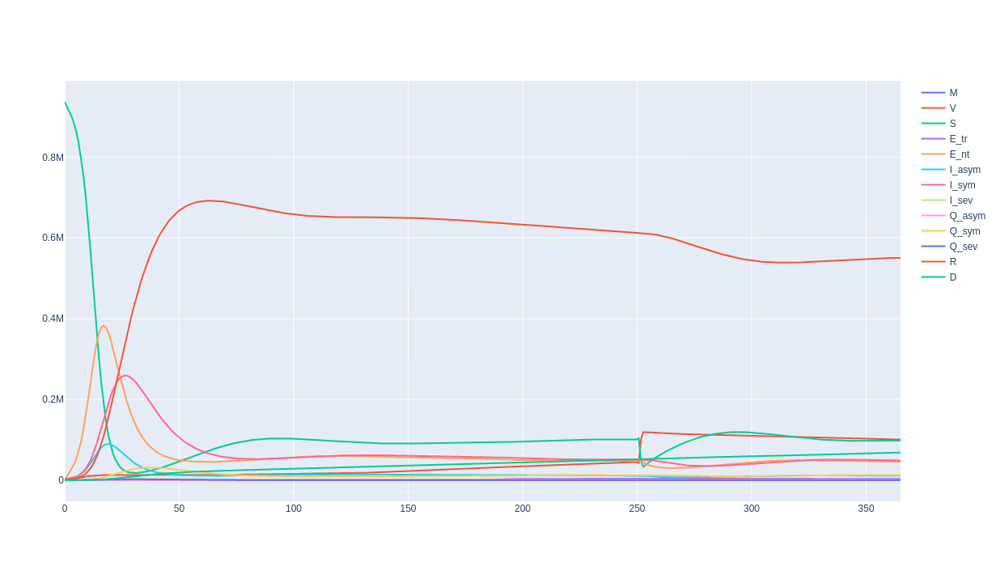

In [5]:
test.plot_sim(params=parameters,t=t,seir=False)

In [1]:
import geopandas as gpd
import pandas as pd

In [2]:
from app.data_handler import DataHandler

dh = DataHandler()

In [3]:
covid_df = dh.get_recorded_covid_cases("RKI_COVID19.csv")
covid_df

,Bundesland,Landkreis,Altersgruppe,Meldedatum,AnzahlFall,AnzahlTodesfall,NeuGenesen,RS
0,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/17 00:00:00,3,0,0,01001
1,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/17 00:00:00,1,0,0,01001
2,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/18 00:00:00,1,0,0,01001
3,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/18 00:00:00,1,0,0,01001
4,Schleswig-Holstein,SK Flensburg,A15-A34,2021/02/18 00:00:00,1,0,0,01001
...,...,...,...,...,...,...,...,...
3387383,Thüringen,LK Altenburger Land,A80+,2020/12/25 00:00:00,1,1,-9,16077
3387384,Thüringen,LK Altenburger Land,A80+,2020/12/25 00:00:00,4,0,0,16077
3387385,Thüringen,LK Altenburger Land,A80+,2020/12/25 00:00:00,2,2,-9,16077
3387386,Thüringen,LK Altenburger Land,A80+,2020/12/27 00:00:00,3,0,0,16077


In [4]:
filename = "data/RKI_Corona_Landkreise.geojson"
rs_df = dh.get_district_geometries(filename)
rs_df

,GEN,RS,geometry
0,Flensburg,01001,"POLYGON ((9.41266 54.82264, 9.41318 54.82124, ..."
1,Kiel,01002,"POLYGON ((10.16916 54.43138, 10.16957 54.43067..."
2,Lübeck,01003,"POLYGON ((10.87683 53.98737, 10.87884 53.98595..."
3,Neumünster,01004,"POLYGON ((9.99545 54.14972, 9.99713 54.14806, ..."
4,Dithmarschen,01051,"MULTIPOLYGON (((8.69258 54.06045, 8.69364 54.0..."
...,...,...,...
394,Saalfeld-Rudolstadt,16073,"POLYGON ((11.26298 50.83328, 11.26504 50.83207..."
395,Saale-Holzland-Kreis,16074,"POLYGON ((11.69798 51.08352, 11.69817 51.08319..."
396,Saale-Orla-Kreis,16075,"POLYGON ((11.82990 50.78922, 11.83030 50.78543..."
397,Greiz,16076,"POLYGON ((12.19167 50.96358, 12.19448 50.96045..."


In [5]:
from datetime import datetime, timedelta
c_plt_df = dh.prepare_real_covid_data(covid_df)

/home/yoflem/anaconda3/lib/python3.8/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




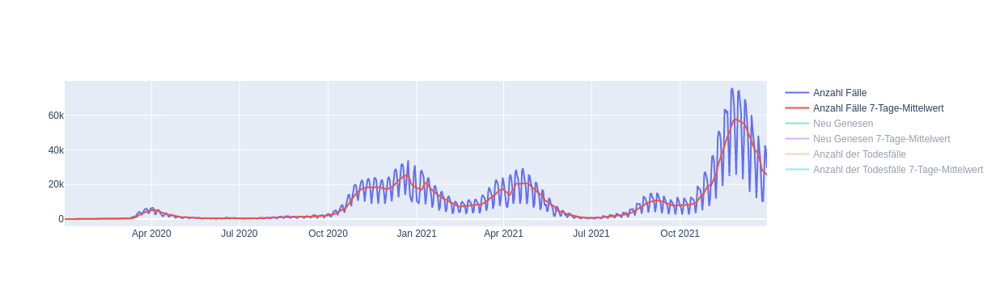

In [6]:
from app.view import View
real_data_plot = View()
real_data_plot.plot_real_data(c_plt_df)

In [7]:
date_lst_germany = dh.get_dates_of_covid_data(covid_df)
date_lst_germany = date_lst_germany[0:20]
date_lst_germany

['2020/01/02 00:00:00',
 '2020/01/23 00:00:00',
 '2020/01/28 00:00:00',
 '2020/01/29 00:00:00',
 '2020/01/31 00:00:00',
 '2020/02/01 00:00:00',
 '2020/02/03 00:00:00',
 '2020/02/04 00:00:00',
 '2020/02/05 00:00:00',
 '2020/02/06 00:00:00',
 '2020/02/07 00:00:00',
 '2020/02/11 00:00:00',
 '2020/02/17 00:00:00',
 '2020/02/18 00:00:00',
 '2020/02/20 00:00:00',
 '2020/02/24 00:00:00',
 '2020/02/25 00:00:00',
 '2020/02/26 00:00:00',
 '2020/02/27 00:00:00',
 '2020/02/28 00:00:00']

In [8]:
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.colors import Normalize, LogNorm
from matplotlib.animation import FuncAnimation
from matplotlib import rc, rcParams
rc('animation', html='jshtml')
rcParams['animation.embed_limit'] = 2**32
plt.style.use('seaborn')

%matplotlib inline
plt.rcParams['figure.figsize'] = [16, 12]

In [9]:
from app.MyFuncAnimator import MyFuncAnimator

  0%|          | 0/21 [00:00<?, ?it/s]

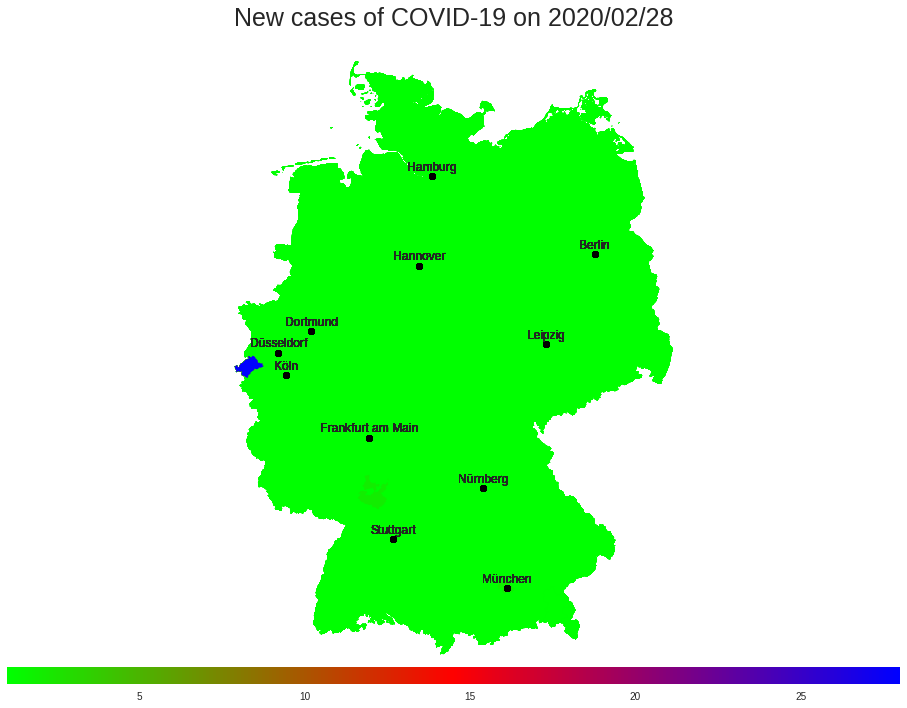

In [10]:
myfunc_germany = MyFuncAnimator(covid_df,rs_df,date_lst_germany,"AnzahlFall")
my_germany = myfunc_germany.FuncAnimator()
my_germany